>#  Data Analysis Tasks(Level-2)
---

**Note:** If you face any issues with file reading, please change the `file_path` variable based on the location of your data file on your system.

In [57]:
import pandas as pd
import matplotlib.pyplot as plt

In [59]:
file_path = r'C:\Users\Akshit Sajwan\Desktop\Cognifyz_Internship\Working Zone\DATA ANALYSIS TASK LIST AND DATASET\internship_tasks\dataset\dataset.csv'

In [61]:
df=pd.read_csv(file_path)
df.head()

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229


# Task 1: Restaurant Ratings

1. Analyze the distribution of aggregate ratings and determine the most common rating range.

2. Calculate the average number of votes received by restaurants.

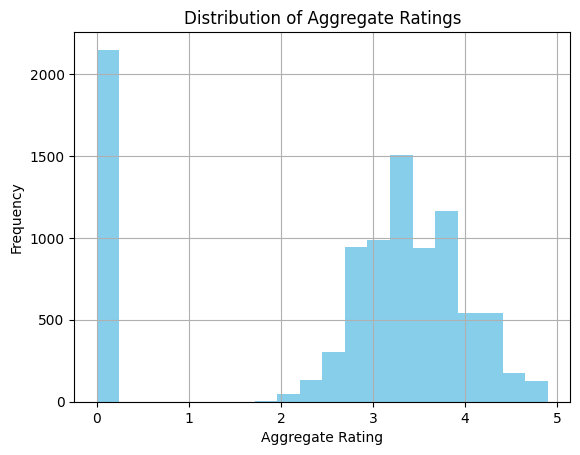

In [64]:
df['Aggregate rating'].hist(bins=20, color='skyblue')
plt.title('Distribution of Aggregate Ratings')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.show()

In [66]:
rating_counts = pd.cut(df['Aggregate rating'], bins=5).value_counts()
print("Most common rating range:")
print(rating_counts)

Most common rating range:
Aggregate rating
(2.94, 3.92]       4590
(-0.0049, 0.98]    2148
(1.96, 2.94]       1430
(3.92, 4.9]        1380
(0.98, 1.96]          3
Name: count, dtype: int64


In [68]:
avg_votes = df['Votes'].mean()
print("Average number of votes received by restaurants:", avg_votes)

Average number of votes received by restaurants: 156.909747670401


## Conclusion

* *Most common rating range:
Aggregate rating
(2.94, 3.92]       4590
(-0.0049, 0.98]    2148
(1.96, 2.94]       1430
(3.92, 4.9]        1380
(0.98, 1.96]          3*
* *Average number of votes received by restaurants: 156.909747670401*

# Task 2: Cuisine Combination

1. Identify the most common combinations of cuisines in the dataset.

2. Determine if certain cuisine combinations tend to have higher ratings.

In [72]:
cuisine_series = df['Cuisines'].dropna().str.split(', ')
cuisine_combinations = cuisine_series.apply(frozenset)
cuisine_combinations_counts = cuisine_combinations.value_counts()

In [73]:
top_cuisine_combinations = cuisine_combinations_counts.head(5)
print("Top 10 most common cuisine combinations:")
print(top_cuisine_combinations)

Top 10 most common cuisine combinations:
Cuisines
(North Indian)             936
(North Indian, Chinese)    616
(North Indian, Mughlai)    395
(Fast Food)                354
(Chinese)                  354
Name: count, dtype: int64


In [76]:
cuisine_combinations_avg_rating = df.groupby(cuisine_combinations)['Aggregate rating'].mean().dropna()
print("\nAverage rating for each cuisine combination:")
print(cuisine_combinations_avg_rating)


Average rating for each cuisine combination:
Cuisines
(Japanese, Desserts, French)                                    4.800000
(Nepalese)                                                      1.333333
(Pizza, Asian, North Indian, European, Italian, Continental)    4.100000
(Chinese, Thai, Continental)                                    3.650000
(American, Mexican, Finger Food)                                4.200000
                                                                  ...   
(Thai, Continental, North Indian, Malaysian, Chinese)           3.800000
(South Indian, Biryani)                                         1.500000
(Desserts, Fast Food, Indian, Continental)                      3.800000
(Fast Food, Cafe, Continental)                                  3.700000
(Italian, World Cuisine)                                        3.700000
Name: Aggregate rating, Length: 1339, dtype: float64


## Conclusion
* *Top 10 most common cuisine combinations `Above the conclusion`*
* *Average rating for each cuisine combination `Above the conclusion`*

# Task 3: Geographic Analysis

1. Plot the locations of restaurants on a map using longitude and latitude coordinates.

2. Identify any patterns or clusters of restaurants in specific areas.

In [80]:
import folium
from folium.plugins import MarkerCluster

In [82]:
m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=2)
marker_cluster = MarkerCluster().add_to(m)
for idx, row in df.iterrows():
    folium.Marker([row['Latitude'], row['Longitude']], 
                  popup=row['Restaurant Name']).add_to(marker_cluster)
m

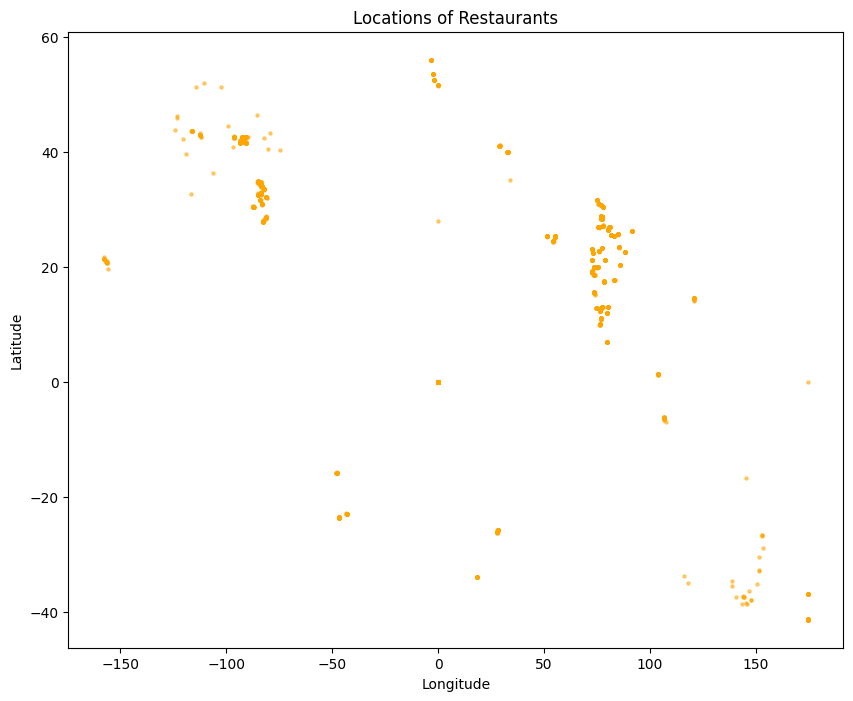

In [83]:
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 8))
plt.scatter(df['Longitude'], df['Latitude'], color='orange', s=5, alpha=0.5)
plt.title('Locations of Restaurants')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

## Conclusion
* *The locations of restaurants on a map using longitude and latitude coordinates is generated by folium*

* *Identify any patterns or clusters of restaurants in specific area: It reveals areas with high restaurant density and helps identify patterns such as clustering in specific regions. High-density clusters may indicate popular urban centers or culinary hotspots.*

# Task 4: Restaurant Chains

1. Identify if there are any restaurant chains present in the dataset.
2. Analyze the ratings and popularity of different restaurant chains.

In [86]:
restaurant_chains = df['Restaurant Name'].value_counts()
top_restaurant_chains = restaurant_chains.head(10)
print("Top 10 restaurant chains:")
print(top_restaurant_chains)

Top 10 restaurant chains:
Restaurant Name
Cafe Coffee Day     83
Domino's Pizza      79
Subway              63
Green Chick Chop    51
McDonald's          48
Keventers           34
Pizza Hut           30
Giani               29
Baskin Robbins      28
Barbeque Nation     26
Name: count, dtype: int64


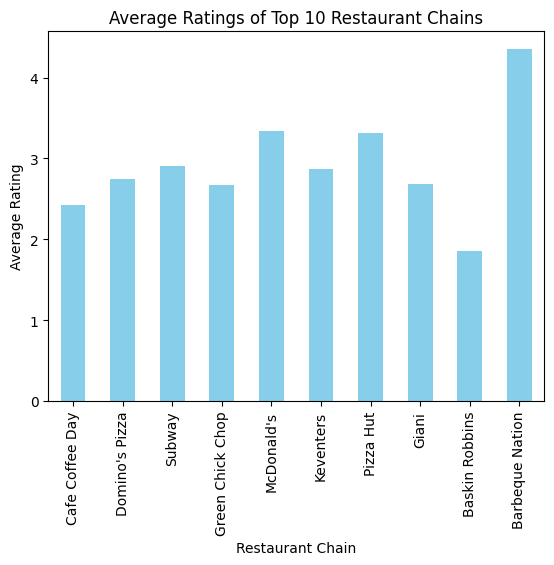

In [87]:
restaurant_chain_ratings = df.groupby('Restaurant Name')['Aggregate rating'].mean().dropna()
top_chain_ratings = restaurant_chain_ratings.loc[top_restaurant_chains.index]
top_chain_ratings.plot(kind='bar', color='skyblue')
plt.title('Average Ratings of Top 10 Restaurant Chains')
plt.xlabel('Restaurant Chain')
plt.ylabel('Average Rating')
plt.show()


## Conclusion
* *dataset contains multiple restaurant chains, with the top 10 chains having the highest number of outlets*

* *bar chart displaying the average ratings of the top 10 restaurant chains reveals the quality and customer satisfaction of each chain*